<a href="https://colab.research.google.com/github/Miguel743/proyectosDatos/blob/main/ArbolDeDesicion_Encuesta.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
%%capture
!pip install funpymodeling
!pip install pandas-profiling==2.7.1

import pandas as pd
from pandas_profiling import ProfileReport
from google.colab.data_table import DataTable
from funpymodeling.exploratory import status, profiling_num, freq_tbl, cat_vars,num_vars 
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np


In [ ]:
# 1. CARGA DE DATOS Y SEPARACION TR/TS
data11= pd.read_excel('/content/drive/MyDrive/data/data11.xlsx')
data11= data11.drop(['Unnamed: 0', 'salario_mensual_o_retiro_bruto_en_tu_moneda_local'], axis=1)
data11.columns

Index(['anos_de_experiencia', 'tipo_de_contrato', 'seniority',
       'tiene_gente_a_cargo', 'trabajo_de_02', 'salario_bruto'],
      dtype='object')

In [ ]:
data14= pd.get_dummies(data11)
data14= data14.drop(['tipo_de_contrato_Freelance', 'seniority_Junior',
       'tiene_gente_a_cargo_No', 'trabajo_de_02_Architect',
       'salario_bruto_BAJO'], axis=1)

In [ ]:
import pickle
with open('/content/drive/MyDrive/data/data14_5.pickle', 'wb') as f:
    pickle.dump(data14, f)

In [ ]:
data14_x= data14.drop('salario_bruto_ALTO', axis=1)
data14_y= data14['salario_bruto_ALTO']

In [ ]:
# 2. CREANDO EL DECISION TREE DEFAULT
from sklearn import tree
model = tree.DecisionTreeClassifier() 
model.fit(data14_x, data14_y)

DecisionTreeClassifier()

In [ ]:
# 3. VISUALIZACION DE REGLAS
from IPython.display import Image  
from sklearn.tree import export_graphviz # tienen que tener instalado graphviz: https://graphviz.org/download/
import pydotplus

In [ ]:
print(tree.export_graphviz(model, None))

In [ ]:
from sklearn.tree import export_text

In [ ]:
tree_rules = export_text(model, feature_names=list(data14_x))
print(tree_rules)

In [ ]:
# 4. VISUALIZACION DEL MODELO EN ARBOL
import pydotplus

In [ ]:
# Graficamos el árbol
dot_data = tree.export_graphviz(model, 
                                out_file=None, 
                                feature_names=list(data14_x.columns.values), 
                                class_names=['No', 'Si'], 
                                rounded=True, 
                                filled=True)

graph = pydotplus.graph_from_dot_data(dot_data)

# Ploteamos:
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.838739 to fit



In [ ]:
# Vemos que tenemos un arbol de con de 20 niveles. Vamos acotar un poco mediante los parametros  'max_depth', 'min_sample_split' y 'min_sample_leaf'
# Creamos un segundo modelo
from sklearn import tree
model2 = tree.DecisionTreeClassifier(max_depth=5,min_samples_split=10) 
model2.fit(data14_x, data14_y)

DecisionTreeClassifier(max_depth=5, min_samples_split=10)

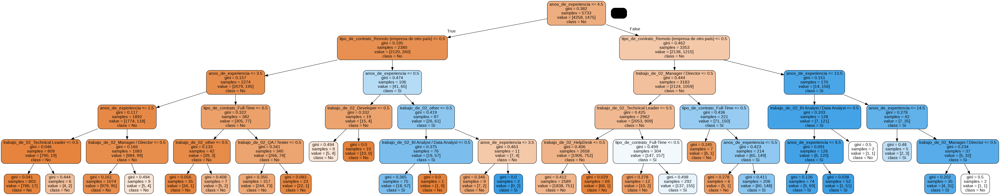

In [ ]:
# Graficamos el árbol
dot_data = tree.export_graphviz(model2, 
                                out_file=None, 
                                feature_names=list(data14_x.columns.values), 
                                class_names=['No', 'Si'], 
                                rounded=True, 
                                filled=True)

graph = pydotplus.graph_from_dot_data(dot_data)

# Ploteamos:
Image(graph.create_png())



*   **Nodo raiz: ** nos muestra como se distribuye la variable en estudio 'sueldo_bruto_ALTO' 
*   **Regla1:** IF 'anos_de_experiencia' <= 4.5 => sueldo bruto no es alto (class = No)
    soporte = 2380 (2120/2380=89.0%)
*   **Regla2:** IF 'anos_de_experiencia' > 4.5 => sueldo bruto no es alto (class = No)
    soporte = 3353 (2138/3353=63.8%)
*   **Regla3:** IF 'anos_de_experiencia' <= 4.5 AND 'tipo_contrato_Remoto (empresa de otro pais)' = 0 => sueldo bruto no es alto (class = No)
    soporte = 2274 (2079/2274=91.4%)
*   **Regla4:** IF 'anos_de_experiencia' <= 4.5 AND 'tipo_contrato_Remoto (empresa de otro pais)' = 1 => sueldo bruto es alto (class = Si)
    soporte = 106 (65/106 =61.3%)
*   **Regla5:** IF 'anos_de_experiencia' <= 4.5 AND 'tipo_contrato_Remoto (empresa de otro pais)' = 1 AND 'anos_de_experiencia' > 0 => sueldo bruto es alto (class = Si) soporte = 87 (61/87 =70.1%)
*   **Regla6:** IF 'anos_de_experiencia' <= 4.5 AND 'tipo_contrato_Remoto (empresa de otro pais)' = 1 AND 'anos_de_experiencia' >0  AND 'trabajo_02_other' = 0 => sueldo bruto es alto (class = Si)
soporte = 76 (57/76 =75.0%)
*   **Regla6:** IF 'anos_de_experiencia' <= 4.5 AND 'tipo_contrato_Remoto (empresa de otro pais)' = 1 AND 'anos_de_experiencia' >0  AND 'trabajo_02_other' = 0 AND 'trabajo_02_BI Analyst/Data Analyst' = 1 => sueldo bruto es alto (class = Si)
soporte = 76 (57/75 =76.0%)



Un poco de storytelling 



In [ ]:
# 5. VALIDACION DE REGLAS CON FILTROS